## Library List

In [ ]:
!pip install category_encoders
!pip install scikit-optimize

In [ ]:
import os
import folium
import pandas as pd
import geopandas as gpd

from shapely.geometry import Point
from category_encoders import BinaryEncoder
from sklearn.preprocessing import LabelEncoder

## The region selected for this research.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
shapefile_path = "/content/drive/MyDrive/Colab Notebooks/data_maps/data/base_files/CTYUA_DEC_2024_UK_BFC.shp"
gdf = gpd.read_file(shapefile_path)

gdf_filtered = gdf[gdf['CTYUA24CD'].isin(['W06000009', 'W06000010', 'W06000011', 'W06000012', 'W06000013', 'W06000014', 'W06000015', 'W06000016', 'W06000018', 'W06000019', 'W06000020','W06000021', 'W06000022', 'W06000024'])]

output_south_wales_shapefile_path = "/content/drive/MyDrive/Colab Notebooks/data_maps/data/county_shape_files/south_east_wales_shape.shp"
gdf_filtered.to_file(output_south_wales_shapefile_path)

print(f"New shapefile created with one record: {output_south_wales_shapefile_path}")

New shapefile created with one record: /content/drive/MyDrive/Colab Notebooks/data_maps/data/county_shape_files/south_east_wales_shape.shp


In [ ]:
shapefile_path = "/content/drive/MyDrive/Colab Notebooks/weather_project/data/major_cities_shape_file/TCITY_2015_EW_BGG_V2.shp"
gdf = gpd.read_file(shapefile_path)

gdf_filtered = gdf[gdf['TCITY15CD'].isin(['J01000020', 'J01000064', 'J01000098'])]

output_cities_shapefile_path = "/content/drive/MyDrive/Colab Notebooks/data_maps/data/major_cities_shape_file/major_cities_shape.shp"
gdf_filtered.to_file(output_cities_shapefile_path)

print(f"New shapefile created with one record: {output_cities_shapefile_path}")

New shapefile created with one record: /content/drive/MyDrive/Colab Notebooks/data_maps/data/major_cities_shape_file/major_cities_shape.shp


In [ ]:
south_east_wales_data = gpd.read_file(output_south_wales_shapefile_path)
south_east_wales_data = south_east_wales_data.to_crs("EPSG:4326")

wales_city_data = gpd.read_file(output_cities_shapefile_path)
wales_city_data = wales_city_data.to_crs("EPSG:4326")

weather_stations_filepath = "/content/drive/MyDrive/Colab Notebooks/weather_project/data/weather_stations.csv"
weather_stations_dataset = pd.read_csv(weather_stations_filepath)

weather_stations_visual_crossing_filepath = "/content/drive/MyDrive/Colab Notebooks/weather_project/data/south_wales_stations_visual_crossing.csv"
weather_stations_visual_crossing_dataset = pd.read_csv(weather_stations_visual_crossing_filepath)

In [ ]:
map_centroid = [south_east_wales_data['LAT'].mean(), south_east_wales_data['LONG'].mean()]
active_stations = []

my_map = folium.Map(location=map_centroid, zoom_start=10, control_scale=True, tiles=None)
folium.TileLayer(tiles="cartodb positron", control=False).add_to(my_map)
folium.GeoJson(data=south_east_wales_data, style_function=lambda feature: {"fillColor": "#007EA7", "color": "", "weight": 0.5, 'fillOpacity': 0.3},
  name="East South Wales").add_to(my_map)

folium.GeoJson(data=wales_city_data, style_function=lambda feature: {"fillColor": "#003459", "color": "", "weight": 0.5, 'fillOpacity': 0.5},
  name="Major City Areas").add_to(my_map)

stations_layer = folium.FeatureGroup(name="Weather Stations", show=True)
for _idx, _row in weather_stations_dataset.iterrows():
  lat, _, lon = _row['Location'].partition(",")
  lat, lon = float(lat), float(lon)
  point = Point(lon, lat)
  if south_east_wales_data.contains(point).any():
    active_stations.append((lat, lon, _row['Station name'], _row['Station type'], "UK Met Office"))
    tooltip_text = f"""<b>Station Name:</b> {_row['Station name']}<br><b>Station Type:</b> {_row['Station type']}<br><b>Source:</b> UK Met Office<br>"""
    if _row['Station type'] == "Automatic":
      folium.Marker(location=[lat, lon], icon=folium.Icon(color="lightred", fill_opacity=0.7, weight=0.5, fill=True, icon="cloud"), tooltip=tooltip_text).add_to(stations_layer)
    else:
      folium.Marker(location=[lat, lon], icon=folium.Icon(color="lightblue", fill_opacity=0.7, weight=0.5, fill=True, icon="cloud"), tooltip=tooltip_text).add_to(stations_layer)

stations_visual_crossing_layer = folium.FeatureGroup(name="Visual Crossing Weather Stations", show=True)
for _idx, _row in weather_stations_visual_crossing_dataset.iterrows():
  lat, lon = float(_row['Latitude']), float(_row['Longitude'])
  point = Point(lon, lat)
  if south_east_wales_data.contains(point).any():
    active_stations.append((lat, lon, _row['Station Name'], "N/A", "Visual Crossing"))
    tooltip_text = f"""<b>Station Name:</b> {_row['Station Name']}<br><b>Station Type:</b> N/A<br><b>Source:</b> Visual Crossing<br>"""
    folium.Marker(location=[lat, lon], icon=folium.Icon(color="gray", fill_opacity=0.7, weight=0.5, fill=True, icon="cloud"), tooltip=tooltip_text).add_to(stations_visual_crossing_layer)

stations_visual_crossing_layer.add_to(my_map)
stations_layer.add_to(my_map)
folium.LayerControl().add_to(my_map)
my_map

In [ ]:
df = pd.DataFrame(active_stations, columns=['Latitude', 'Longitude', 'Station Name', 'Station Type', 'Station Source'])
df

,Latitude,Longitude,Station Name,Station Type,Station Source
0,51.488,-3.187,"Cardiff, Bute Park",Automatic,UK Met Office
1,51.555,-3.720,Margam No 2,Manual,UK Met Office
2,51.708,-5.052,Milford Haven Conservancy Board,Automatic,UK Met Office
3,51.785,-3.184,Nantyglo,Automatic,UK Met Office
4,51.714,-4.366,Pembrey Sands,Automatic,UK Met Office
5,52.013,-4.369,Saron,Manual,UK Met Office
6,51.859,-4.920,Scolton Country Park,Automatic,UK Met Office
7,51.405,-3.440,St Athan,Automatic,UK Met Office
8,51.668,-4.706,Tenby,Manual,UK Met Office
9,51.714,-2.922,Usk No 2,Automatic,UK Met Office


## Reading Weather Data



In [ ]:
original_weather_data = pd.DataFrame()
root_dir = '/content/drive/MyDrive/Colab Notebooks/weather_project/data/weather_data'

for sub_dir, dirs, files in os.walk(root_dir):
  for file in files:
    if file.endswith('.csv'):
      file_path = os.path.join(sub_dir, file)
      df = pd.read_csv(file_path, on_bad_lines='skip',  parse_dates=['datetime'])
      df = df.sort_values('datetime').reset_index(drop=True)
      original_weather_data = pd.concat([original_weather_data, df])

import gc
gc.collect()

0

## Data Processing for the Algorithm



In [ ]:
original_weather_data.head(5)

,name,address,latitude,longitude,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,...,visibility,solarradiation,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description
0,Whitechurch,"51.988,-4.678",51.988,-4.678,2015-01-01,12.2,10.3,11.2,12.2,10.3,...,5.7,10.8,0.9,1.0,NaN,2015-01-01T08:26:53,2015-01-01T16:17:37,0.37,"Rain, Partially cloudy",Partly cloudy throughout the day with a chance...
1,"Cardiff, Bute Park","51.488,-3.187",51.488,-3.187,2015-01-01,12.2,9.9,11.3,12.2,7.5,...,5.9,8.8,0.6,0.0,NaN,2015-01-01T08:18:25,2015-01-01T16:14:09,0.37,"Rain, Overcast",Cloudy skies throughout the day with a chance ...
2,Usk No 2,"51.714,-2.922",51.714,-2.922,2015-01-01,12.3,8.6,10.8,12.3,5.7,...,8.7,7.6,0.5,0.0,NaN,2015-01-01T08:18:28,2015-01-01T16:11:58,0.37,"Rain, Overcast",Cloudy skies throughout the day with a chance ...
3,EGFF,"51.4,-3.35",51.400,-3.350,2015-01-01,12.0,10.0,11.3,12.0,7.7,...,5.7,8.8,0.6,0.0,NaN,2015-01-01T08:18:38,2015-01-01T16:15:14,0.37,"Rain, Overcast",Cloudy skies throughout the day with a chance ...
4,Tenby,"51.668,-4.706",51.668,-4.706,2015-01-01,11.9,10.4,11.3,11.9,10.4,...,4.7,12.2,1.1,1.0,NaN,2015-01-01T08:25:23,2015-01-01T16:19:21,0.37,"Rain, Overcast",Cloudy skies throughout the day with rain.


In [ ]:
original_weather_data.shape

(322983, 37)

In [ ]:
original_weather_data = original_weather_data.sort_values('datetime')
original_weather_data.head(5)

,name,address,latitude,longitude,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,...,visibility,solarradiation,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description
6,Whitesands,"51.895,-5.284",51.895,-5.284,1973-01-01,9.9,7.1,8.7,7.2,2.5,...,5.7,NaN,NaN,NaN,NaN,1973-01-01T08:28:57,1973-01-01T16:20:45,0.9,Overcast,Cloudy skies throughout the day.
9,EW8865 Caerphilly UK,"51.574,-3.236",51.574,-3.236,1973-01-01,8.9,2.5,5.9,6.9,-0.3,...,5.8,NaN,NaN,NaN,NaN,1973-01-01T08:19:09,1973-01-01T16:14:09,0.9,Partially cloudy,Partly cloudy throughout the day.
8,Pembrey Sands,"51.714,-4.366",51.714,-4.366,1973-01-01,10.0,5.5,8.0,8.3,1.1,...,5.6,NaN,NaN,NaN,NaN,1973-01-01T08:24:22,1973-01-01T16:17:59,0.9,Overcast,Cloudy skies throughout the day.
7,MW0YBZ Wales UK,"51.593,-3.243",51.593,-3.243,1973-01-01,8.9,2.5,5.9,6.9,-0.3,...,5.8,NaN,NaN,NaN,NaN,1973-01-01T08:19:16,1973-01-01T16:14:05,0.9,Partially cloudy,Partly cloudy throughout the day.
12,"Cardiff, Bute Park","51.488,-3.187",51.488,-3.187,1973-01-01,9.0,2.7,6.1,6.9,-0.1,...,6.0,NaN,NaN,NaN,NaN,1973-01-01T08:18:31,1973-01-01T16:14:23,0.9,Partially cloudy,Partly cloudy throughout the day.


In [ ]:
from tabulate import tabulate

def display_datatypes(df):
  """Displays the data types of each column in a Pandas DataFrame using tabulate."""
  dtypes = df.dtypes.reset_index()
  dtypes.columns = ['Column Name', 'Data Type']
  print(tabulate(dtypes, headers='keys', tablefmt='grid'))

display_datatypes(original_weather_data)

+----+------------------+----------------+
|    | Column Name      | Data Type      |
+====+==================+================+
|  0 | name             | object         |
+----+------------------+----------------+
|  1 | address          | object         |
+----+------------------+----------------+
|  2 | latitude         | float64        |
+----+------------------+----------------+
|  3 | longitude        | float64        |
+----+------------------+----------------+
|  4 | datetime         | datetime64[ns] |
+----+------------------+----------------+
|  5 | tempmax          | float64        |
+----+------------------+----------------+
|  6 | tempmin          | float64        |
+----+------------------+----------------+
|  7 | temp             | float64        |
+----+------------------+----------------+
|  8 | feelslikemax     | float64        |
+----+------------------+----------------+
|  9 | feelslikemin     | float64        |
+----+------------------+----------------+
| 10 | feel

In [ ]:
null_percentages = original_weather_data.isnull().sum() * 100 / len(original_weather_data)
null_percentages

,0
name,0.000000
address,0.000000
latitude,0.000000
longitude,0.000000
datetime,0.000000
tempmax,0.006812
tempmin,0.006812
temp,8.376911
feelslikemax,0.006812
feelslikemin,0.006812


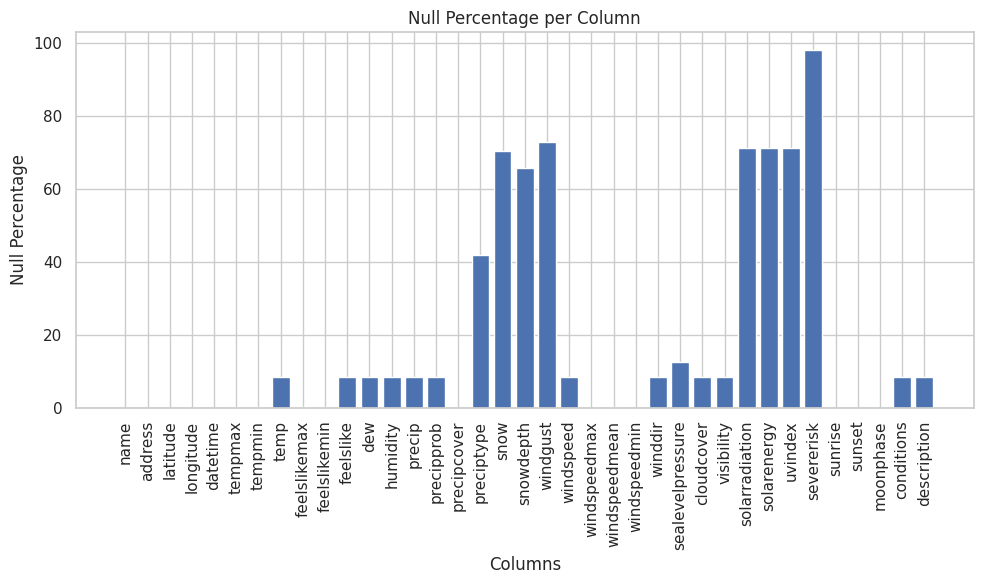

In [ ]:
# prompt: create a bar chart to show how many columns fall under certain null percentage

import matplotlib.pyplot as plt

# Create the bar chart
plt.figure(figsize=(10, 6))  # Adjust figure size for better readability
plt.bar(null_percentages.index, null_percentages.values)
plt.xlabel("Columns")
plt.ylabel("Null Percentage")
plt.title("Null Percentage per Column")
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability if needed
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()


In [ ]:
def check_null_percentage(df, threshold=0.5):
  """Checks the null percentage of columns and displays the ones with more than the specified threshold."""
  null_percentages = df.isnull().mean()
  columns_with_high_nulls = null_percentages[null_percentages > threshold]
  if not columns_with_high_nulls.empty:
    table_data = []
    for column, percentage in columns_with_high_nulls.items():
      table_data.append([column, percentage])

    print(tabulate(table_data, headers=['Column Name', 'Null Percentage'], tablefmt='grid'))
  else:
    print("No columns have more than {}% null values.".format(threshold * 100))

check_null_percentage(original_weather_data)

+----------------+-------------------+
| Column Name    |   Null Percentage |
+================+===================+
| snow           |          0.703703 |
+----------------+-------------------+
| snowdepth      |          0.656864 |
+----------------+-------------------+
| windgust       |          0.729456 |
+----------------+-------------------+
| solarradiation |          0.711551 |
+----------------+-------------------+
| solarenergy    |          0.711551 |
+----------------+-------------------+
| uvindex        |          0.711551 |
+----------------+-------------------+
| severerisk     |          0.979881 |
+----------------+-------------------+


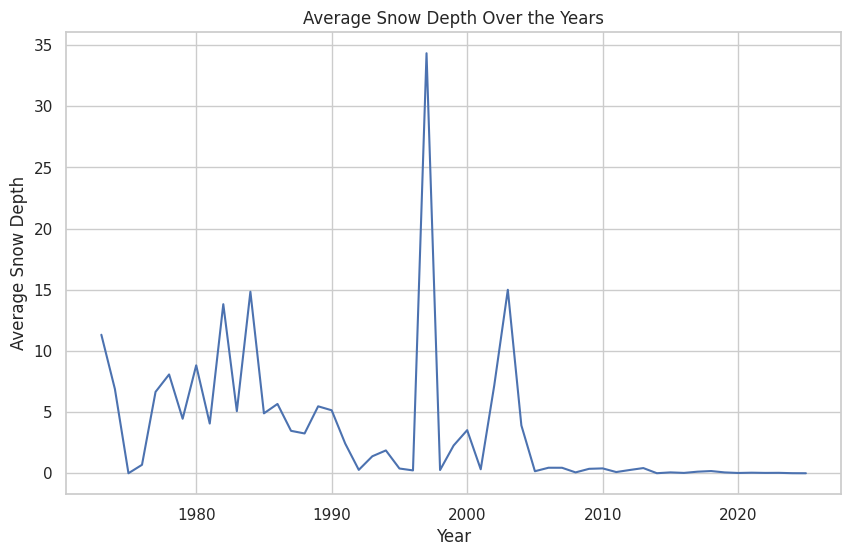

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

original_weather_data['datetime'] = pd.to_datetime(original_weather_data['datetime'])

yearly_snow_depth = original_weather_data.groupby(original_weather_data['datetime'].dt.year)['snowdepth'].mean()

plt.figure(figsize=(10, 6))
plt.plot(yearly_snow_depth.index, yearly_snow_depth.values)
plt.xlabel("Year")
plt.ylabel("Average Snow Depth")
plt.title("Average Snow Depth Over the Years")
plt.grid(True)
plt.show()


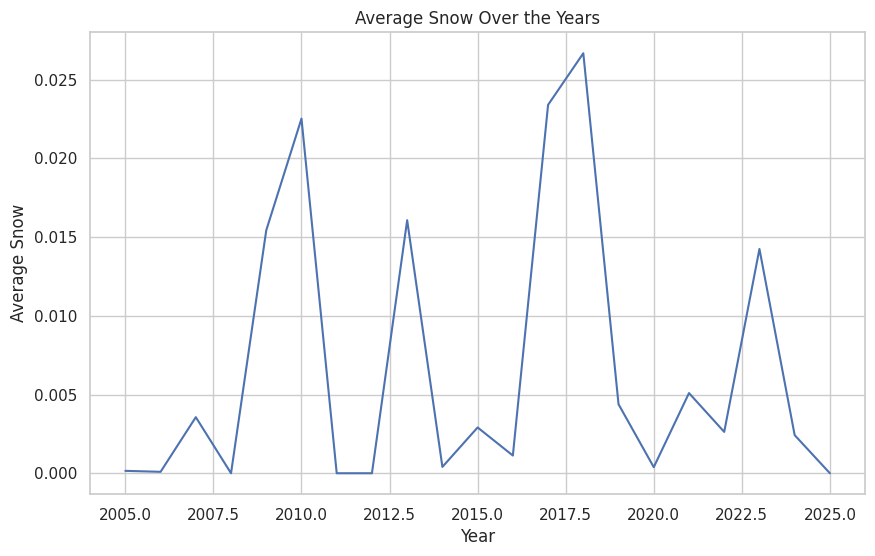

In [ ]:
original_weather_data['datetime'] = pd.to_datetime(original_weather_data['datetime'])

yearly_snow_depth = original_weather_data.groupby(original_weather_data['datetime'].dt.year)['snow'].mean()

plt.figure(figsize=(10, 6))
plt.plot(yearly_snow_depth.index, yearly_snow_depth.values)
plt.xlabel("Year")
plt.ylabel("Average Snow")
plt.title("Average Snow Over the Years")
plt.grid(True)
plt.show()


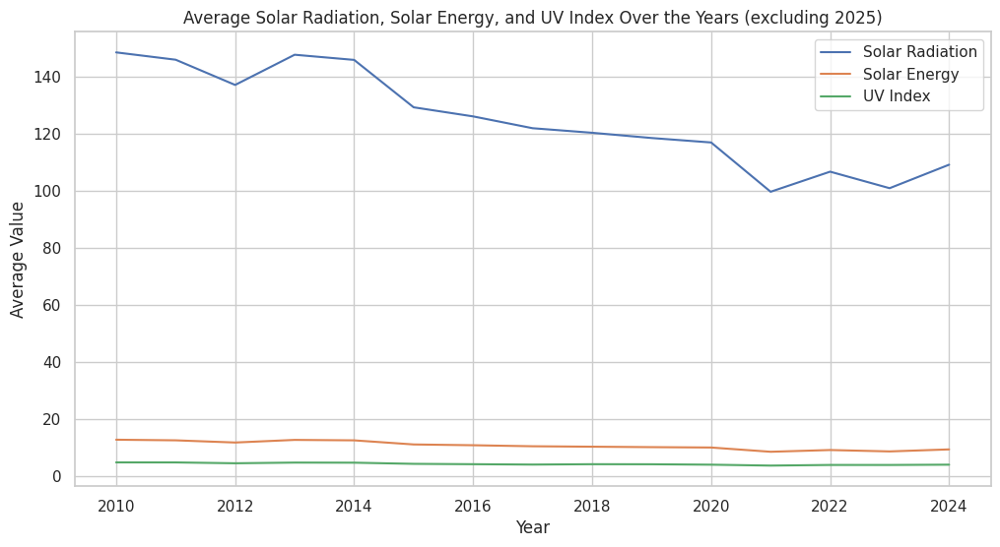

In [ ]:
# prompt: plot "solarradiation”, “solarenergy”, “uvindex" over the years(leave out 2025) in one frame

import matplotlib.pyplot as plt

# Assuming 'original_weather_data' DataFrame is already loaded and processed

# Convert 'datetime' to datetime objects if not already
original_weather_data['datetime'] = pd.to_datetime(original_weather_data['datetime'])

# Extract year
original_weather_data['year'] = original_weather_data['datetime'].dt.year

# Filter out the year 2025
filtered_data = original_weather_data[original_weather_data['year'] != 2025]

# Group data by year and calculate the mean for each column
yearly_data = filtered_data.groupby('year')[['solarradiation', 'solarenergy', 'uvindex']].mean()

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(yearly_data.index, yearly_data['solarradiation'], label='Solar Radiation')
plt.plot(yearly_data.index, yearly_data['solarenergy'], label='Solar Energy')
plt.plot(yearly_data.index, yearly_data['uvindex'], label='UV Index')

plt.xlabel('Year')
plt.ylabel('Average Value')
plt.title('Average Solar Radiation, Solar Energy, and UV Index Over the Years (excluding 2025)')
plt.legend()
plt.grid(True)
plt.show()


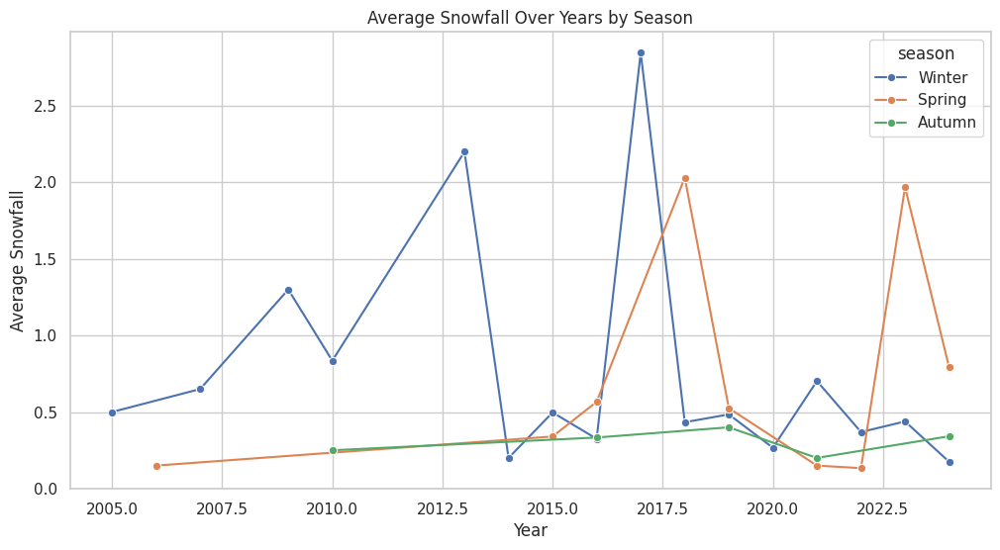

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

snow_data = original_weather_data.dropna(subset=['snow']).query('snow > 0')
snow_data['datetime'] = pd.to_datetime(snow_data['datetime'])
snow_data['year'] = snow_data['datetime'].dt.year
snow_data['month'] = snow_data['datetime'].dt.month

def assign_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

snow_data['season'] = snow_data['month'].apply(assign_season)
seasonal_snowfall = snow_data.groupby(['year', 'season'])['snow'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='snow', hue='season', data=seasonal_snowfall, marker='o')
plt.title('Average Snowfall Over Years by Season')
plt.xlabel('Year')
plt.ylabel('Average Snowfall')
plt.grid(True)
plt.show()


<ipython-input-68-d5739e294edc>:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



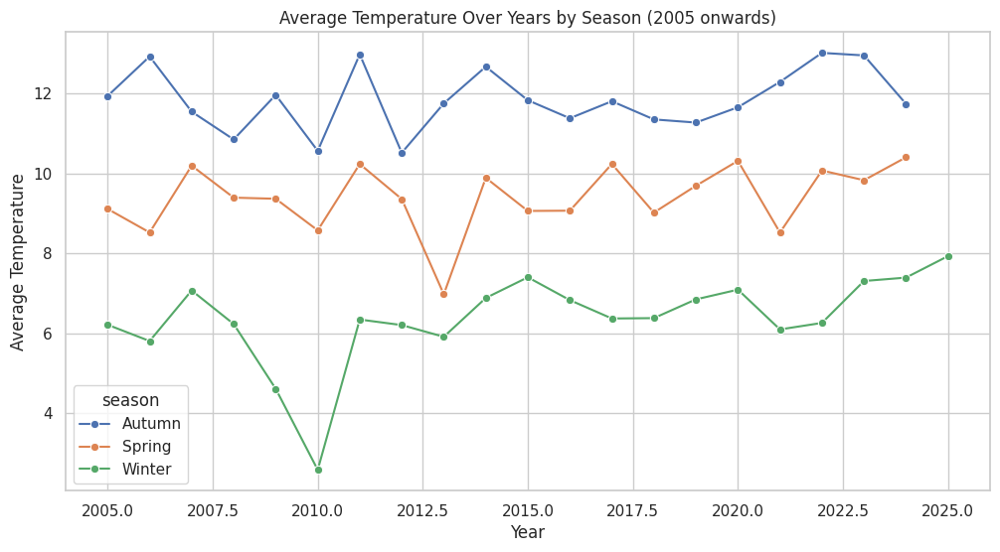

In [ ]:
original_weather_data['datetime'] = pd.to_datetime(original_weather_data['datetime'])

data_2005_onwards = original_weather_data[original_weather_data['datetime'].dt.year >= 2005]

def assign_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

data_2005_onwards['season'] = data_2005_onwards['datetime'].dt.month.apply(assign_season)

seasonal_temps = data_2005_onwards.groupby([data_2005_onwards['datetime'].dt.year, 'season'])['temp'].mean().reset_index()

seasonal_temps = seasonal_temps[seasonal_temps['season'].isin(['Winter', 'Spring', 'Autumn'])]

plt.figure(figsize=(12, 6))
sns.lineplot(x='datetime', y='temp', hue='season', data=seasonal_temps, marker='o')
plt.title('Average Temperature Over Years by Season (2005 onwards)')
plt.xlabel('Year')
plt.ylabel('Average Temperature')
plt.grid(True)
plt.show()


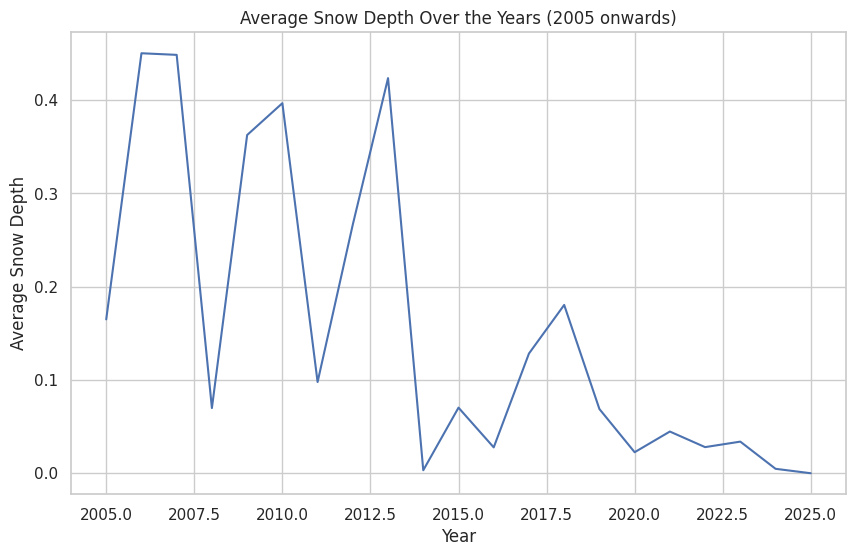

In [ ]:
import matplotlib.pyplot as plt

data_2005_onwards = original_weather_data[original_weather_data['datetime'].dt.year >= 2005]

yearly_snow_depth = data_2005_onwards.groupby(data_2005_onwards['datetime'].dt.year)['snowdepth'].mean()

plt.figure(figsize=(10, 6))
plt.plot(yearly_snow_depth.index, yearly_snow_depth.values)
plt.xlabel("Year")
plt.ylabel("Average Snow Depth")
plt.title("Average Snow Depth Over the Years (2005 onwards)")
plt.grid(True)
plt.show()


<ipython-input-70-882d4650bd54>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-882d4650bd54>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-882d4650bd54>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-882d4

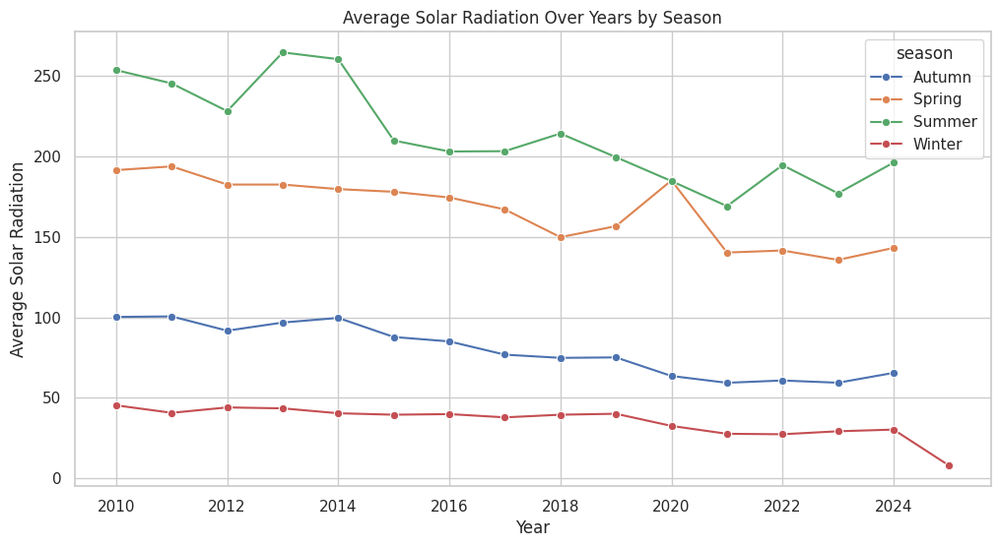

<ipython-input-70-882d4650bd54>:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-882d4650bd54>:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-882d4650bd54>:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-882d

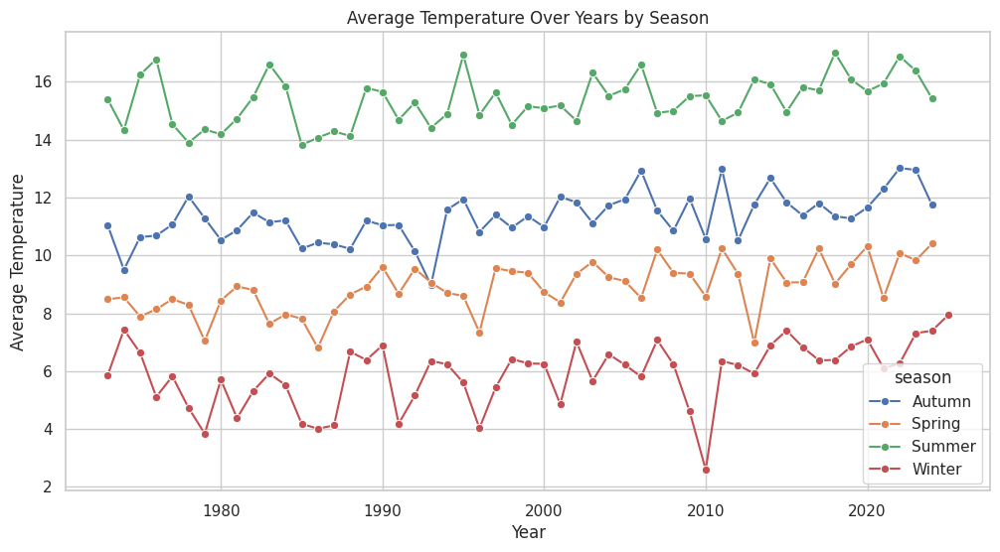

In [ ]:
solar_data = original_weather_data.dropna(subset=['solarradiation'])

solar_data['datetime'] = pd.to_datetime(solar_data['datetime'])

solar_data['year'] = solar_data['datetime'].dt.year
solar_data['month'] = solar_data['datetime'].dt.month

def assign_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

solar_data['season'] = solar_data['month'].apply(assign_season)

seasonal_solarradiation = solar_data.groupby(['year', 'season'])['solarradiation'].mean().reset_index()


plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='solarradiation', hue='season', data=seasonal_solarradiation, marker='o')
plt.title('Average Solar Radiation Over Years by Season')
plt.xlabel('Year')
plt.ylabel('Average Solar Radiation')
plt.grid(True)
plt.show()


temperature_data = original_weather_data.dropna(subset=['temp'])
temperature_data['datetime'] = pd.to_datetime(temperature_data['datetime'])
temperature_data['year'] = temperature_data['datetime'].dt.year
temperature_data['month'] = temperature_data['datetime'].dt.month
temperature_data['season'] = temperature_data['month'].apply(assign_season)

seasonal_temperature = temperature_data.groupby(['year', 'season'])['temp'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='temp', hue='season', data=seasonal_temperature, marker='o')
plt.title('Average Temperature Over Years by Season')
plt.xlabel('Year')
plt.ylabel('Average Temperature')
plt.grid(True)
plt.show()


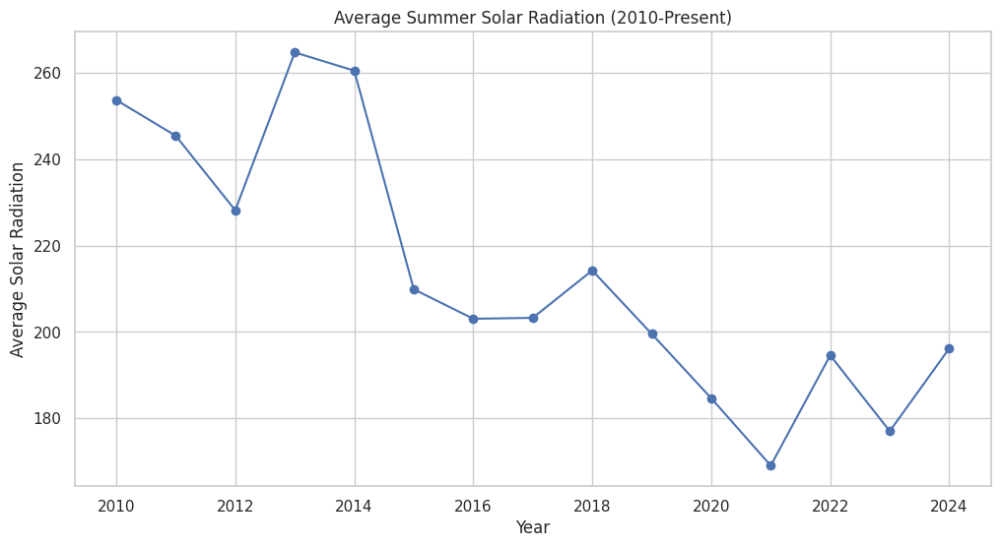

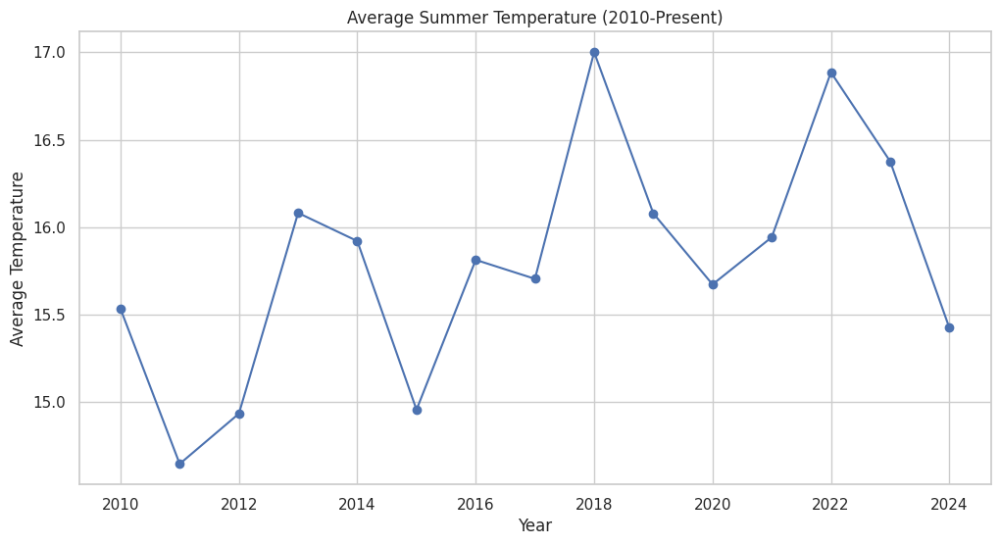

In [ ]:
# prompt: solar radiation and temperature in summer since 2010

# Assuming 'original_weather_data' DataFrame is available from the previous code

# Filter data for summer since 2010
summer_data_since_2010 = original_weather_data[
    (original_weather_data['datetime'].dt.year >= 2010) &
    (original_weather_data['datetime'].dt.month.isin([6, 7, 8]))
]

# Solar radiation analysis for summer since 2010
summer_solar_data = summer_data_since_2010.dropna(subset=['solarradiation'])
yearly_solar_avg = summer_solar_data.groupby(summer_solar_data['datetime'].dt.year)['solarradiation'].mean()


plt.figure(figsize=(12, 6))
plt.plot(yearly_solar_avg.index, yearly_solar_avg.values, marker='o')
plt.title('Average Summer Solar Radiation (2010-Present)')
plt.xlabel('Year')
plt.ylabel('Average Solar Radiation')
plt.grid(True)
plt.show()


# Temperature analysis for summer since 2010
summer_temp_data = summer_data_since_2010.dropna(subset=['temp'])
yearly_temp_avg = summer_temp_data.groupby(summer_temp_data['datetime'].dt.year)['temp'].mean()


plt.figure(figsize=(12, 6))
plt.plot(yearly_temp_avg.index, yearly_temp_avg.values, marker='o')
plt.title('Average Summer Temperature (2010-Present)')
plt.xlabel('Year')
plt.ylabel('Average Temperature')
plt.grid(True)
plt.show()


<ipython-input-72-a06e683257a3>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



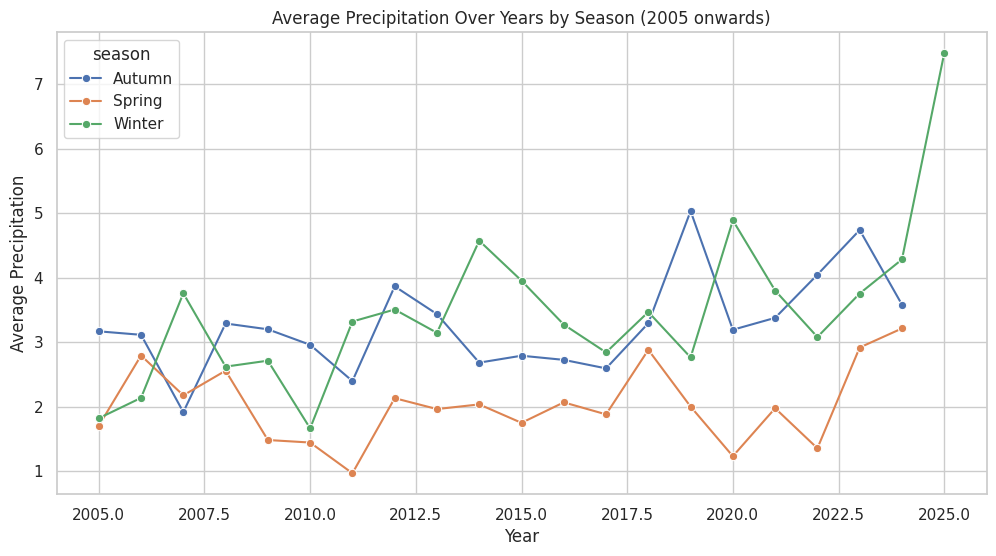

In [ ]:
original_weather_data['datetime'] = pd.to_datetime(original_weather_data['datetime'])

data_2005_onwards = original_weather_data[original_weather_data['datetime'].dt.year >= 2005]

def assign_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

data_2005_onwards['season'] = data_2005_onwards['datetime'].dt.month.apply(assign_season)

seasonal_precipitation = data_2005_onwards.groupby([data_2005_onwards['datetime'].dt.year, 'season'])['precip'].mean().reset_index()

seasonal_precipitation = seasonal_precipitation[seasonal_precipitation['season'].isin(['Winter', 'Spring', 'Autumn'])]

plt.figure(figsize=(12, 6))
sns.lineplot(x='datetime', y='precip', hue='season', data=seasonal_precipitation, marker='o')
plt.title('Average Precipitation Over Years by Season (2005 onwards)')
plt.xlabel('Year')
plt.ylabel('Average Precipitation')
plt.grid(True)
plt.show()


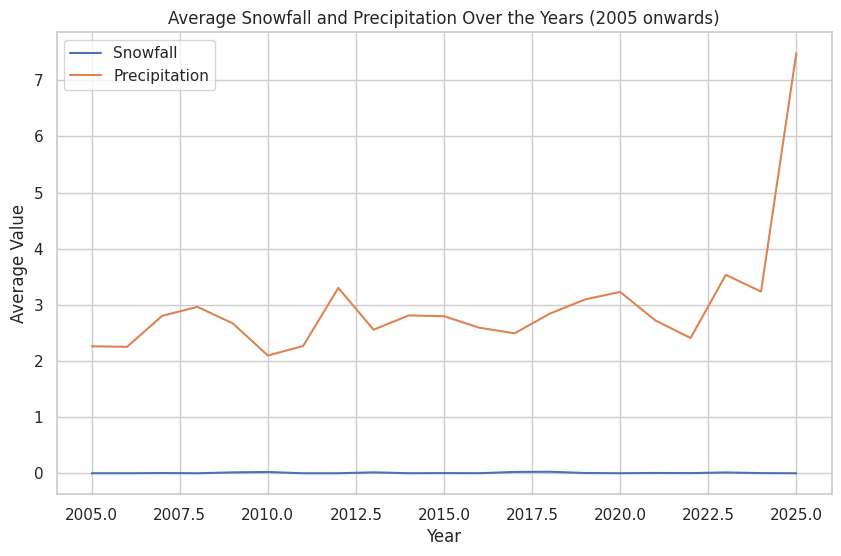

In [ ]:
original_weather_data['datetime'] = pd.to_datetime(original_weather_data['datetime'])

data_2005_onwards = original_weather_data[original_weather_data['datetime'].dt.year >= 2005]

yearly_data = data_2005_onwards.groupby(data_2005_onwards['datetime'].dt.year)[['snow', 'precip']].mean()

plt.figure(figsize=(10, 6))
plt.plot(yearly_data.index, yearly_data['snow'], label='Snowfall')
plt.plot(yearly_data.index, yearly_data['precip'], label='Precipitation')
plt.xlabel("Year")
plt.ylabel("Average Value")
plt.title("Average Snowfall and Precipitation Over the Years (2005 onwards)")
plt.legend()
plt.grid(True)
plt.show()


##Data Cleaning

In [ ]:
cleaned_weather_data = pd.DataFrame(original_weather_data)

cleaned_weather_data[['latitude', 'longitude']] = cleaned_weather_data['address'].str.extract(r'([\d\.\-]+),\s*([\d\.\-]+)')

cleaned_weather_data['latitude'] = cleaned_weather_data['latitude'].astype(float)
cleaned_weather_data['longitude'] = cleaned_weather_data['longitude'].astype(float)

cleaned_weather_data["datetime"] = pd.to_datetime(cleaned_weather_data["datetime"])
cleaned_weather_data["record_datetime"] = cleaned_weather_data["datetime"].astype(int) // 10**9
cleaned_weather_data["year"] = cleaned_weather_data["datetime"].dt.year
cleaned_weather_data["month"] = cleaned_weather_data["datetime"].dt.month
cleaned_weather_data["day"] = cleaned_weather_data["datetime"].dt.day
cleaned_weather_data["dayofweek"] = cleaned_weather_data["datetime"].dt.weekday #Monday=0, Sunday=6

lebal = LabelEncoder()
cleaned_weather_data["preciptype_encoded"] = lebal.fit_transform(cleaned_weather_data["preciptype"])

cleaned_weather_data["sunrise"] = pd.to_datetime(cleaned_weather_data["sunrise"]).dt.hour + pd.to_datetime(cleaned_weather_data["sunrise"]).dt.minute / 60
cleaned_weather_data["sunset"] = pd.to_datetime(cleaned_weather_data["sunset"]).dt.hour + pd.to_datetime(cleaned_weather_data["sunset"]).dt.minute / 60
cleaned_weather_data["daylight_hours"] = cleaned_weather_data["sunset"] - cleaned_weather_data["sunrise"]

cleaned_weather_data["conditions"] = cleaned_weather_data["conditions"].fillna("N/A")
conditions = cleaned_weather_data['conditions'].str.split(', ')

cleaned_weather_data["conditions_split"] = cleaned_weather_data["conditions"].str.split(", ")
unique_conditions = set([condition for sublist in cleaned_weather_data["conditions_split"] for condition in sublist])
for condition in unique_conditions:
  column_name = f"condition_{condition}"
  cleaned_weather_data[column_name] = cleaned_weather_data["conditions_split"].apply(lambda x: 1 if condition in x else 0)
weather_copy = cleaned_weather_data.copy()

cleaned_weather_data.fillna(cleaned_weather_data.median(numeric_only=True), inplace=True)

cleaned_weather_data.drop(columns=['name'], inplace=True)
cleaned_weather_data.drop(columns=["address"], inplace=True)
cleaned_weather_data.drop(columns=["datetime"], inplace=True)
cleaned_weather_data.drop(columns=["preciptype"], inplace=True)
cleaned_weather_data.drop(columns=["description"], inplace=True)
cleaned_weather_data.drop(columns=["conditions"], inplace=True)
cleaned_weather_data.drop(columns=["conditions_split"], inplace=True)

<ipython-input-75-9f8600d414ad>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




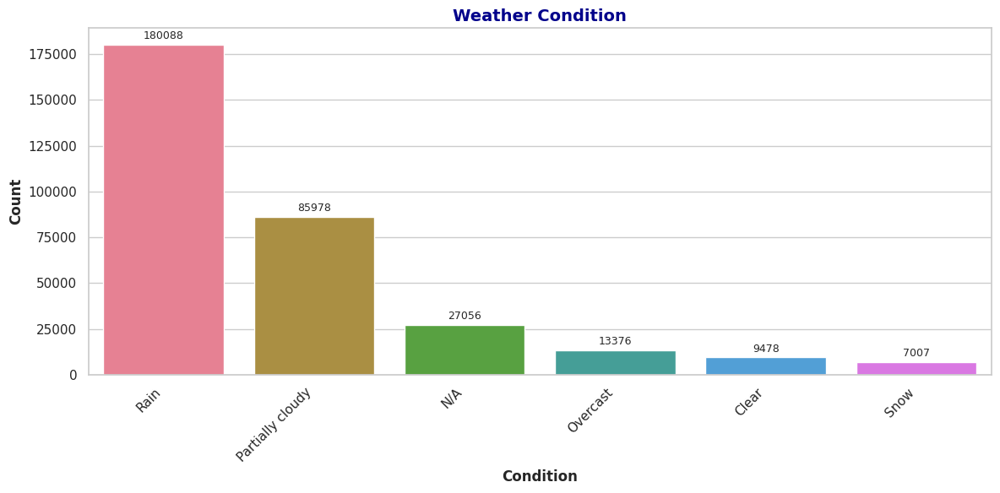

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

weather_copy["primary_condition"] = weather_copy["conditions_split"].str[0]

condition_counts = weather_copy['primary_condition'].value_counts()

condition_df = condition_counts.reset_index()
condition_df.columns = ['Primary Condition', 'Count']

plt.figure(figsize=(12, 6))
sns.set(style='whitegrid')

sns.barplot(
    data=condition_df,
    x='Primary Condition',
    y='Count',
    palette='husl'
)

for index, row in condition_df.iterrows():
    plt.text(index, row['Count'] + max(condition_df['Count'])*0.01, str(row['Count']),
             ha='center', va='bottom', fontsize=9)

plt.title('Weather Condition', fontsize=14, fontweight='bold', color='darkblue')
plt.xlabel('Condition', fontsize=12, fontweight='bold')
plt.ylabel('Count', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


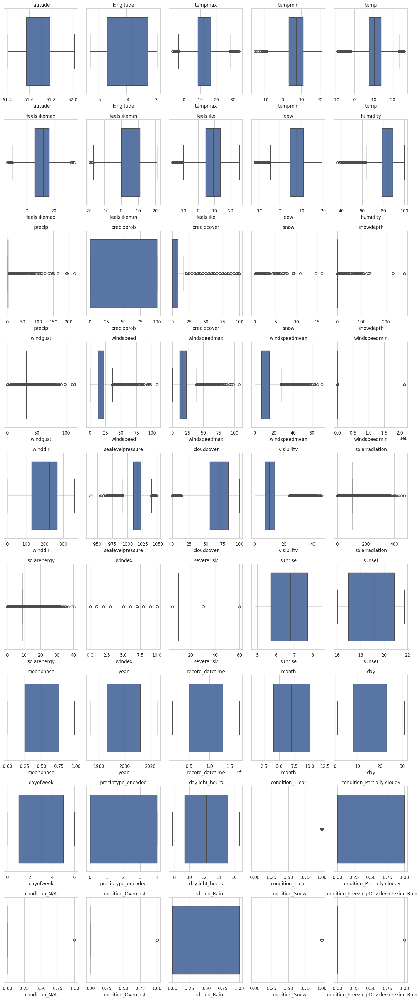

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def show_outliers(selected_features, dataset):

  num_features = len(selected_features)
  cols = 5
  rows = int(np.ceil(num_features / cols))

  fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
  axes = axes.flatten()

  for i, feature in enumerate(selected_features):
    if feature in dataset.columns:
      sns.boxplot(x=dataset[feature], ax=axes[i])
      axes[i].set_title(feature)
    else:
      axes[i].axis("off")

  for i in range(num_features, len(axes)):
    axes[i].axis("off")

  plt.tight_layout()
  plt.show()

all_features = [col for col in cleaned_weather_data.columns]
show_outliers(all_features, cleaned_weather_data)

In [ ]:
threshold = 0.5
original_weather_data = original_weather_data.dropna(thresh=original_weather_data.shape[0] * (1 - threshold), axis=1)

In [ ]:
processed_weather_data = pd.DataFrame(cleaned_weather_data)
condition_features = [col for col in processed_weather_data.columns if col.startswith("condition_")]
model_features = [feature for feature in all_features if feature in processed_weather_data.columns and processed_weather_data[feature].dtype != 'O' and (feature not in condition_features)]

In [ ]:
for feature in model_features:
  Q1 = processed_weather_data[feature].quantile(0.25)
  Q3 = processed_weather_data[feature].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  median_value = processed_weather_data[feature].median()
  processed_weather_data[feature] = np.where((processed_weather_data[feature] < lower_bound) | (processed_weather_data[feature] > upper_bound), median_value, processed_weather_data[feature])

window_size = 10
for feature in model_features:
  processed_weather_data[feature] = processed_weather_data[feature].rolling(window=window_size, min_periods=1).mean()

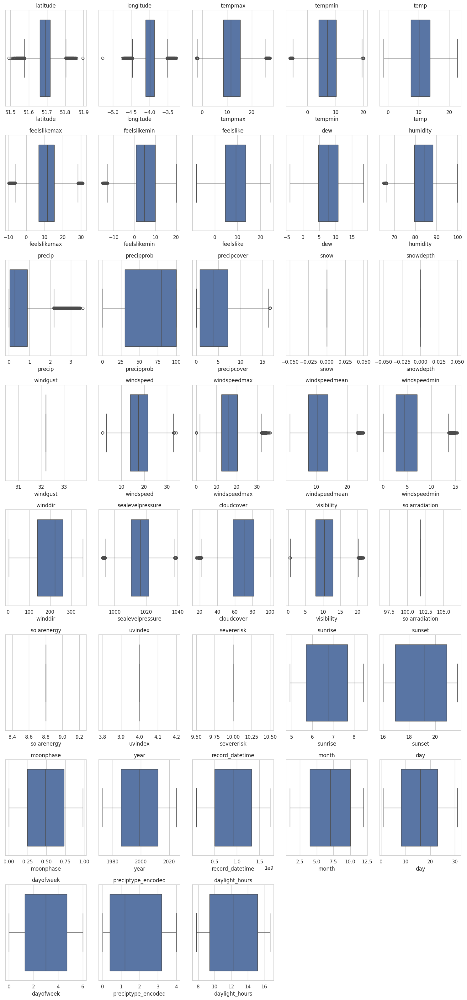

In [ ]:
show_outliers(model_features, processed_weather_data)

In [ ]:
_correlation_matrix = processed_weather_data.corr()
_correlation_pairs = _correlation_matrix.unstack()
_correlation_pairs = _correlation_pairs[_correlation_pairs.index.get_level_values(0) != _correlation_pairs.index.get_level_values(1)]
_sorted_correlation_pairs = _correlation_pairs.abs().sort_values(ascending=False)

_best_correlations = _sorted_correlation_pairs[_sorted_correlation_pairs >= 0.3]
_best_correlations_data_list = _best_correlations.reset_index()
_best_correlations_data_list.columns = ['target_feature', 'selected_feature', 'correlation']
_conditions_correlations = _best_correlations_data_list[(_best_correlations_data_list['target_feature'].isin(condition_features))]

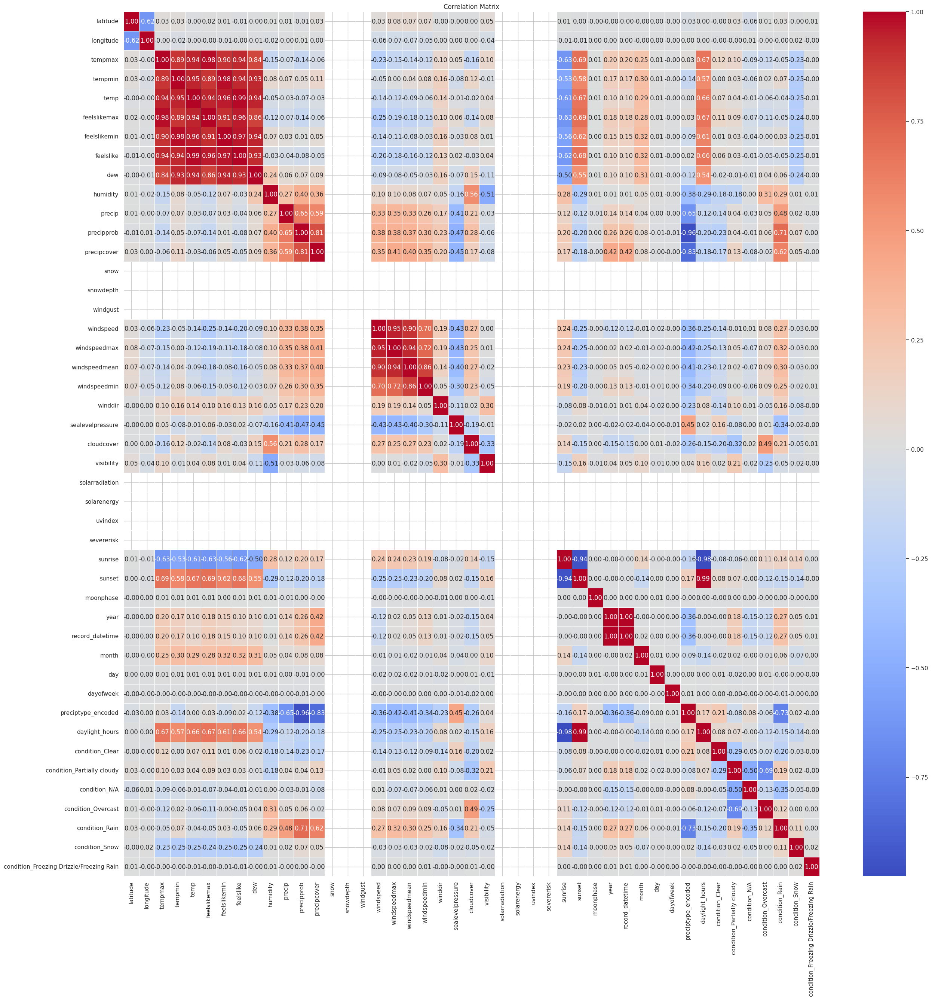

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(30, 30))
sns.heatmap(_correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [ ]:
import plotly.graph_objects as go
import pandas as pd

correlation_matrix_pivot = _conditions_correlations.pivot_table(index='target_feature', columns='selected_feature', values='correlation', fill_value=0)

fig = go.Figure(data=go.Heatmap(z=correlation_matrix_pivot.values, x=correlation_matrix_pivot.columns, y=correlation_matrix_pivot.index, colorscale='cividis', colorbar=dict(title="Correlation"),))
fig.update_layout(title="Condition Correlations Heatmap (values > 0.3)", xaxis_title="Selected Features", yaxis_title="Condition Features", template="plotly_white", width=1000, height=800,)
fig.show()

In [ ]:
selected_features = _best_correlations_data_list['selected_feature'].unique()

## Data Preparation for Modeling

In [ ]:
from sklearn.model_selection import train_test_split
from scipy import stats
from sklearn.preprocessing import StandardScaler

spliting_file_path = "/content/drive/MyDrive/Colab Notebooks/weather_project/data/otherdata/"

X_train_scaled_path = os.path.join(spliting_file_path, "X_train.csv")
X_test_scaled_path  = os.path.join(spliting_file_path, "X_test.csv")
y_train_path = os.path.join(spliting_file_path, "y_train.csv")
y_test_path  = os.path.join(spliting_file_path, "y_test.csv")

if os.path.exists(X_train_scaled_path) and os.path.exists(X_test_scaled_path) and os.path.exists(y_train_path) and os.path.exists(y_test_path):

  X_train_scaled = pd.read_csv(X_train_scaled_path)
  X_test_scaled = pd.read_csv(X_test_scaled_path)
  y_train = pd.read_csv(y_train_path)
  y_test = pd.read_csv(y_test_path)

else:
  X = processed_weather_data[selected_features]
  y = processed_weather_data[condition_features]

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

  scaler = StandardScaler()
  X_train_scaled = scaler.fit_transform(X_train)
  X_test_scaled = scaler.transform(X_test)

  # Convert the scaled data to DataFrames
  X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=selected_features)
  X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=selected_features)

  # Save the scaled data to CSV files
  X_train_scaled_df.to_csv(X_train_scaled_path, index=False)
  X_test_scaled_df.to_csv(X_test_scaled_path, index=False)
  y_train.to_csv(y_train_path, index=False)
  y_test.to_csv(y_test_path, index=False)

##Modeling Weather Data

In [ ]:
from sklearn.multioutput import MultiOutputClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, SVR
from sklearn.metrics import accuracy_score, f1_score, make_scorer, classification_report, confusion_matrix, multilabel_confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV
import joblib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.multioutput import MultiOutputClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score

In [ ]:
model_save_dir = "/content/drive/MyDrive/Colab Notebooks/weather_project/data/models"
os.makedirs(model_save_dir, exist_ok=True)

f1_macro = make_scorer(f1_score, average='macro')

classification_results = {}
best_params = {}

In [ ]:
model_list_1 = {
    "Logistic Regression": {
        "model": MultiOutputClassifier(LogisticRegression(max_iter=1000)),
        "params": {
            'estimator__C': [0.1, 1, 10],
            'estimator__penalty': ['l2'],
            'estimator__solver': ['lbfgs']
        }
    },
    "Decision Trees": {
        "model": MultiOutputClassifier(DecisionTreeClassifier()),
        "params": {
            'estimator__max_depth': [None, 10, 20],
            'estimator__min_samples_split': [2, 5]
        }
    },
    "Random Forest": {
        "model": MultiOutputClassifier(RandomForestClassifier()),
        "params": {
            'estimator__n_estimators': [100, 200],
            'estimator__max_depth': [None, 10, 20]
        }
    }
}

for name, config in model_list_1.items():
    model_filename = os.path.join(model_save_dir, f"{name.replace(' ', '_')}_model.pkl")

    try:
        if os.path.exists(model_filename):
            print(f"\nLoading saved model for {name}...")
            best_model = joblib.load(model_filename)
        else:
            print(f"\nTraining {name}...")

            grid_search = GridSearchCV(estimator=config["model"], param_grid=config["params"], cv=3, n_jobs=-1, verbose=0)
            grid_search.fit(X_train_scaled, y_train)

            best_model = grid_search.best_estimator_
            best_params[name] = grid_search.best_params_

            # Save the model
            joblib.dump(best_model, model_filename)
            print(f"{name} model saved to {model_filename}")

        y_pred = best_model.predict(X_test_scaled)
        classification_results[name] = {
            "Accuracy": accuracy_score(y_test, y_pred),
            "F1-Score (Macro)": f1_score(y_test, y_pred, average='macro'),
            "Confusion Matrix": multilabel_confusion_matrix(y_test, y_pred),
            "Classification Report": classification_report(y_test, y_pred, output_dict=True)
        }

        print(f"{name} evaluation completed!")

    except Exception as e:
        print(f"Model {name} failed: {str(e)}")
        classification_results[name] = {"Accuracy": np.nan, "F1-Score (Macro)": np.nan,  "Confusion Matrix": np.nan, "Classification Report": np.nan}


Loading saved model for Logistic Regression...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.



Logistic Regression evaluation completed!

Loading saved model for Decision Trees...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.



Decision Trees evaluation completed!

Loading saved model for Random Forest...
Random Forest evaluation completed!


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.



In [ ]:
model_list_2 = {
    "XGBoost": {
        "model": MultiOutputClassifier(XGBClassifier()),
        "params": {
            'estimator__n_estimators': [100, 200],
            'estimator__max_depth': [3, 5]
        }
    },
    "LightGBM": {
        "model": MultiOutputClassifier(LGBMClassifier()),
        "params": {
            'estimator__num_leaves': [31, 50],
            'estimator__learning_rate': [0.1, 0.05]
        }
    },
}

for name, config in model_list_2.items():
    model_filename = os.path.join(model_save_dir, f"{name.replace(' ', '_')}_model.pkl")

    try:
        if os.path.exists(model_filename):
            print(f"\nLoading saved model for {name}...")
            best_model = joblib.load(model_filename)
        else:
            print(f"\nTraining {name}...")

            grid_search = GridSearchCV(estimator=config["model"], param_grid=config["params"], cv=3, n_jobs=-1, verbose=0)
            grid_search.fit(X_train_scaled, y_train)

            best_model = grid_search.best_estimator_
            best_params[name] = grid_search.best_params_

            joblib.dump(best_model, model_filename)
            print(f"{name} model saved to {model_filename}")

        y_pred = best_model.predict(X_test_scaled)
        classification_results[name] = {
            "Accuracy": accuracy_score(y_test, y_pred),
            "F1-Score (Macro)": f1_score(y_test, y_pred, average='macro'),
            "Confusion Matrix": multilabel_confusion_matrix(y_test, y_pred),
            "Classification Report": classification_report(y_test, y_pred, output_dict=True)
        }

        print(f"{name} evaluation completed!")

    except Exception as e:
        print(f"Model {name} failed: {str(e)}")
        classification_results[name] = {"Accuracy": np.nan, "F1-Score (Macro)": np.nan,  "Confusion Matrix": np.nan, "Classification Report": np.nan}


Loading saved model for XGBoost...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



XGBoost evaluation completed!

Loading saved model for LightGBM...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all

LightGBM evaluation completed!


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.



In [ ]:
from sklearn.metrics import accuracy_score, f1_score, classification_report, multilabel_confusion_matrix

model_name = "Gradient Boosting"
model_filename = os.path.join(model_save_dir, f"{model_name.replace(' ', '_')}_model.pkl")
if os.path.exists(model_filename):
  print(f"\nLoading saved model for {model_name}...")
  gb_model = joblib.load(model_filename)
else:
  print(f"\nTraining {model_name}...")

  gb_model = MultiOutputClassifier(GradientBoostingClassifier(n_estimators=100, learning_rate=0.1))
  gb_model.fit(X_train_scaled, y_train)

  joblib.dump(gb_model, model_filename)
  print(f"GradientBoosting model saved to {model_filename}")

y_pred = gb_model.predict(X_test_scaled)
classification_results[model_name] = {
    "Accuracy": accuracy_score(y_test, y_pred),
    "F1-Score (Macro)": f1_score(y_test, y_pred, average='macro'),
    "Confusion Matrix": multilabel_confusion_matrix(y_test, y_pred),
    "Classification Report": classification_report(y_test, y_pred, output_dict=True)
}


Loading saved model for Gradient Boosting...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.



In [ ]:
from sklearn.metrics import precision_score

table_data = []
for model_name, results in classification_results.items():
  accuracy = results["Accuracy"]
  f1_macro = results["F1-Score (Macro)"]
  precision_macro = results['Classification Report']['weighted avg']['precision']
  table_data.append([model_name, accuracy, precision_macro, f1_macro])

headers = ["Model", "Accuracy", "Precision (Macro)", "F1-Score (Macro)"]
print(tabulate(table_data, headers=headers, tablefmt="grid"))

+---------------------+------------+---------------------+--------------------+
| Model               |   Accuracy |   Precision (Macro) |   F1-Score (Macro) |
+=====================+============+=====================+====================+
| Logistic Regression |   0.986398 |            0.996461 |           0.807503 |
+---------------------+------------+---------------------+--------------------+
| Decision Trees      |   0.98423  |            0.995692 |           0.799173 |
+---------------------+------------+---------------------+--------------------+
| Random Forest       |   0.984798 |            0.996368 |           0.799832 |
+---------------------+------------+---------------------+--------------------+
| XGBoost             |   0.986594 |            0.996531 |           0.808578 |
+---------------------+------------+---------------------+--------------------+
| LightGBM            |   0.9839   |            0.995086 |           0.804423 |
+---------------------+------------+----

In [ ]:
import xgboost as xgb
import shap

xgb_model_filename = "/content/drive/MyDrive/Colab Notebooks/weather_project/data/models/XGBoost_model.pkl"

if os.path.exists(xgb_model_filename):
  print(f"\nLoading saved model for XGBoost...")
  xgb_model = joblib.load(xgb_model_filename)
else:
  print(f"\nTraining XGBoost...")
  xgb_model = xgb.MultiOutputClassifier(XGBClassifier())
  xgb_model.fit(X_train, y_train)
  joblib.dump(xgb_model, xgb_model_filename)

explainer = shap.Explainer(lambda X: xgb_model.predict(X), X_train)
shap_values = explainer(X_test)

shap.summary_plot(shap_values, X_test)


Loading saved model for XGBoost...


PermutationExplainer explainer:  39%|███▉      | 37611/96895 [8:15:53<11:47:53,  1.40it/s]

In [ ]:
import pandas as pd
import numpy as np

predicted = model.predict(X_test)

explanations = []

for i in range(len(X_test)):
    instance = X_test.iloc[i]
    instance_shap_values = shap_values[i].values

    top_idx = np.argsort(np.abs(instance_shap_values))[-3:]
    top_features = X_test.columns[top_idx]
    top_contributions = instance_shap_values[top_idx]

    explanation = "; ".join(
        [f"Feature '{feature}' contributed {contribution:.2f}"
         for feature, contribution in zip(top_features, top_contributions)]
    )
    explanations.append(explanation)

results_df = pd.DataFrame({
    'Test Value': y_test,
    'Predicted Value': predicted,
    'Explanation': explanations
})

print(results_df.head())
